In [ ]:
!pip install mesh_to_sdf pyrender trimesh
!pip install torch torchvision
!pip install git+https://github.com/facebookresearch/pytorch3d.git@v0.2.0

     |████████████████████████████████| 1.2 MB 8.0 MB/s 
     |████████████████████████████████| 628 kB 46.5 MB/s 
     |████████████████████████████████| 1.1 MB 47.0 MB/s 
     |████████████████████████████████| 890 kB 24.2 MB/s 
     |████████████████████████████████| 1.2 MB 41.8 MB/s 
  Created wheel for PyOpenGL: filename=PyOpenGL-3.1.0-py3-none-any.whl size=1745210 sha256=53a7c7dfc1f6a7f5855240a779bdc3e0608bdbf969e56d459bb144265e39271e
  Stored in directory: /root/.cache/pip/wheels/31/ce/a1/b0c6c92c07204f21248be30ff25d0701edf2e9e821b0d049dd
Successfully built PyOpenGL
  Cloning https://github.com/facebookresearch/pytorch3d.git (to revision v0.2.0) to /tmp/pip-req-build-rwimbyr1
  Running command git clone -q https://github.com/facebookresearch/pytorch3d.git /tmp/pip-req-build-rwimbyr1
  Running command git checkout -q 686c8666d31d932ed42d3cd7319f249fc75e89a9
     |████████████████████████████████| 12.8 MB 19 kB/s 
     |████████████████████████████████| 776.8 MB 16 kB/s 
     |███

In [169]:
!git init

Initialized empty Git repository in /content/.git/


# HW1
point clouds, sdf

In [ ]:
import os
os.environ['PYOPENGL_PLATFORM'] = 'egl'

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline

import torch

# untilitis 
from pytorch3d.utils import ico_sphere

# io utils
from pytorch3d.io import load_obj

# operations with data
from pytorch3d.ops import sample_points_from_meshes

# datastructures
from pytorch3d.structures import Meshes, Textures

# render 
from pytorch3d.renderer import (
    look_at_view_transform,
    OpenGLPerspectiveCameras,
    DirectionalLights, 
    RasterizationSettings, 
    MeshRenderer, 
    MeshRasterizer,  
    HardPhongShader
)

# mesh_to_sdf lib by marian42
from mesh_to_sdf import mesh_to_sdf, sample_sdf_near_surface

# trimesh lib imports
import trimesh
from trimesh.voxel.creation import voxelize

** fvcore version of PathManager will be deprecated soon. **
** Please migrate to the version in iopath repo. **
https://github.com/facebookresearch/iopath 



In [ ]:
# If you have got a CUDA device, you can use GPU mode
if torch.cuda.is_available():
  device = torch.device('cuda:0')
  torch.cuda.set_device(device)
else:
  device = torch.device('cpu')

In [ ]:
path_to_model = '/content/drive/MyDrive/дз Процедурная визуализация/Litten.obj'

In [ ]:
# Trimesh sphere .obj model
trimesh_sphere = trimesh.primitives.Sphere(subdivisions= 4)

# Sphere mesh in pytorch3d
sphere_mesh = ico_sphere(4, device)

verts_rgb = torch.ones_like(sphere_mesh.verts_list()[0])[None]

# Rainbow sphere in pytorch3d
# verts_rgb = torch.rand_like(sphere_mesh.verts_list()[0])[None]

sphere_mesh.textures = Textures(verts_rgb=verts_rgb.to(device))

In [ ]:
# Trimesh bunny .obj model
litten_trimesh = trimesh.load(path_to_model)

if isinstance(litten_trimesh, trimesh.Scene):
    litten_trimesh = litten_trimesh.dump(concatenate=True)

litten_trimesh.vertices -= litten_trimesh.center_mass
scaling = 2 / litten_trimesh.scale
litten_trimesh.apply_scale(scaling=scaling)

# Rainbow bunny in trimesh
# for facet in bunny_trimesh.facets:
#   bunny_trimesh.visual.face_colors[facet] = trimesh.visual.random_color() 

# Bunny mesh in pytorch3d
verts, faces_idx, _ = load_obj(path_to_model)
faces = faces_idx.verts_idx

center = verts.mean(0)
verts = verts - center
scale = max(verts.abs().max(0)[0])
verts = verts / scale

# Initialize each vertex to be white in color.
verts_rgb = torch.ones_like(verts)[None]  # (1, V, 3)

# Rainbow bunny in pytorch3d
# verts_rgb = torch.rand_like(verts)[None]

textures = Textures(verts_rgb=verts_rgb.to(device))

# Create a Meshes object for the bunny.
litten_mesh = Meshes(
    verts=[verts.to(device)],   
    faces=[faces.to(device)], 
    textures=textures
)

/usr/local/lib/python3.6/dist-packages/pytorch3d/io/obj_io.py:484: UserWarning: Mtl file does not exist: /content/drive/MyDrive/дз Процедурная визуализация/Litten.mtl
  warnings.warn(f"Mtl file does not exist: {f_mtl}")


In [ ]:
# Mesh to pointcloud with normals in pytorch3d
num_points_to_sample = 25000

litten_vert, litten_norm = sample_points_from_meshes(
    litten_mesh,
    num_points_to_sample ,
    return_normals=True
)

sphere_vert, sphere_norm = sample_points_from_meshes(
    sphere_mesh,
    num_points_to_sample,
    return_normals=True
)

In [ ]:

def plot_pointcloud(points, elev=70, azim=-70, title=""):
    # Sample points uniformly from the surface of the mesh.
    fig = plt.figure(figsize=(10, 10))
    ax = Axes3D(fig)
    x, y, z = points
    ax.scatter3D(x, z, -y,marker='.')  
    ax.set_xlabel('x')
    ax.set_ylabel('z')
    ax.set_zlabel('y')
    ax.set_title(title)
    ax.view_init(elev, azim)
    plt.show()

In [ ]:
# Initialize an OpenGL perspective camera.
cameras = OpenGLPerspectiveCameras(device=device)

# We will also create a phong renderer. This is simpler and only needs to render one face per pixel.
raster_settings = RasterizationSettings(
    image_size=1024, 
    blur_radius=0, 
    faces_per_pixel=1, 
)

# We can add a directional light in the scene. 
ambient_color = torch.FloatTensor([[0.0, 0.0, 0.0]]).to(device)
diffuse_color = torch.FloatTensor([[1.0, 1.0, 1.0]]).to(device)
specular_color = torch.FloatTensor([[0.1, 0.1, 0.1]]).to(device)
direction = torch.FloatTensor([[1, 1, 1]]).to(device)
lights = DirectionalLights(ambient_color=ambient_color,
                           diffuse_color=diffuse_color,
                           specular_color=specular_color,
                           direction=direction,
                           device=device)

phong_renderer = MeshRenderer(
    rasterizer=MeshRasterizer(
        cameras=cameras, 
        raster_settings=raster_settings
    ),
    shader=HardPhongShader(
        device=device, 
        cameras=cameras, 
        lights=lights
        )
)

In [ ]:
# Select the viewpoint using spherical angles  
distance = 2.0   # distance from camera to the object`
elevation = 40.0   # angle of elevation in degrees
azimuth = 0.0  # No rotation so the camera is positioned on the +Z axis. 

# Get the position of the camera based on the spherical angles
R, T = look_at_view_transform(distance, elevation, azimuth, device=device,at=((-0.02,0.1,0.0),))

# Render the bunny providing the values of R and T. 
image_litten = phong_renderer(meshes_world=litten_mesh, R=R, T=T)

In [ ]:
# Select the viewpoint using spherical angles  
distance = 3.0   # distance from camera to the object`
elevation = 40.0   # angle of elevation in degrees
azimuth = 0.0  # No rotation so the camera is positioned on the +Z axis. 

# Get the position of the camera based on the spherical angles
R, T = look_at_view_transform(distance, elevation, azimuth, device=device,at=((-0.02,0.1,0.0),))

# Render the sphere providing the values of R and T. 
image_sphere = phong_renderer(meshes_world=sphere_mesh, R=R, T=T)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


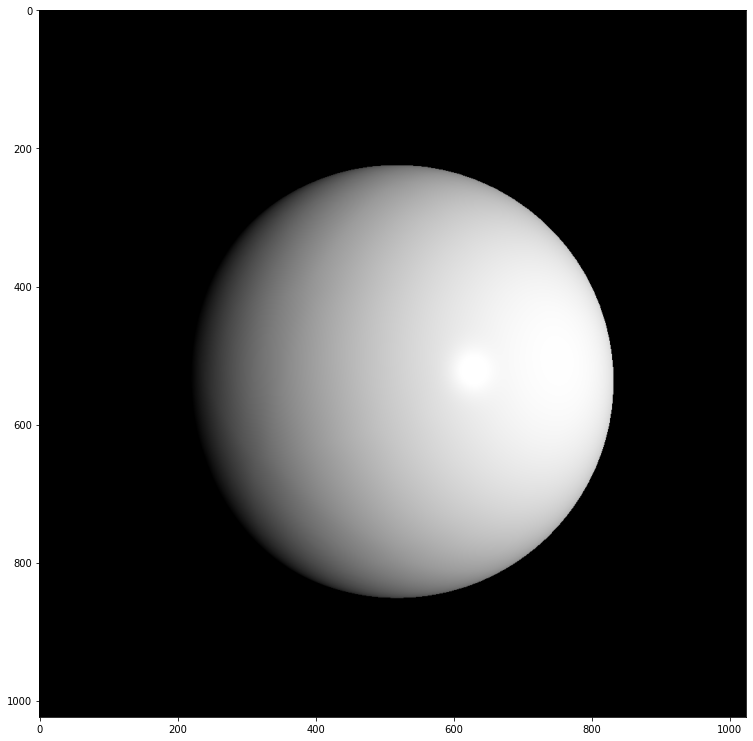

In [ ]:
image_sphere = image_sphere.cpu().numpy()

plt.figure(figsize=(13, 13))
plt.imshow(image_sphere.squeeze())
plt.grid(False)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


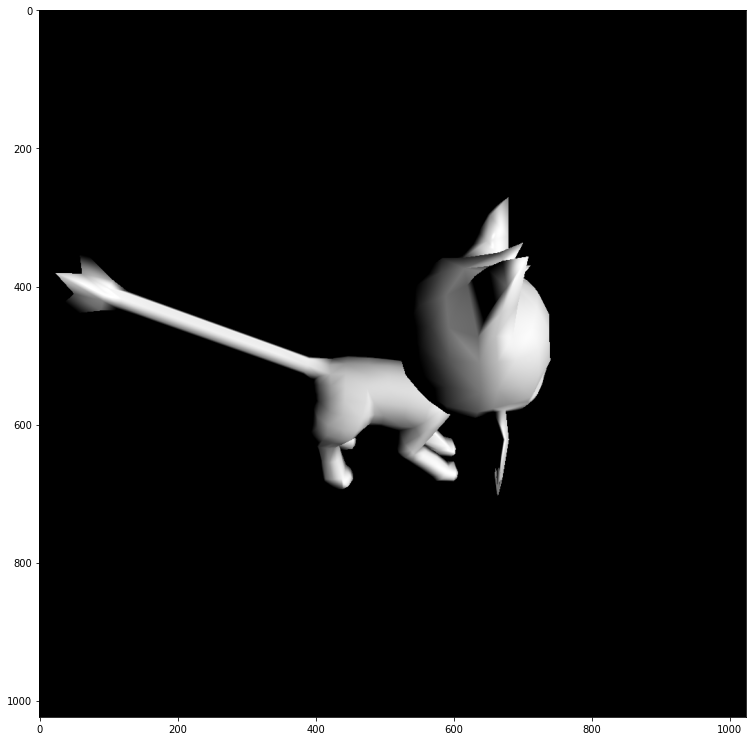

In [ ]:
image_litten = image_litten.cpu().numpy()

plt.figure(figsize=(13, 13))
plt.imshow(image_litten.squeeze())
plt.grid(False)

In [ ]:
trimesh_sphere.show()

In [ ]:
litten_trimesh.show()


In [ ]:
print(
    "Эйлерова характеристика пространственного графа модели litten Xi = V - E + F =",
    litten_trimesh.euler_number
)

print(
    "Эйлерова характеристика пространственного графа модели sphere Xi = V - E + F =",
    trimesh_sphere.euler_number
)

Эйлерова характеристика пространственного графа модели litten Xi = V - E + F = 24
Эйлерова характеристика пространственного графа модели sphere Xi = V - E + F = 2


In [ ]:
print("Is litten mesh watertight:", litten_trimesh.is_watertight)
print("Is sphere mesh watertight:", trimesh_sphere.is_watertight)

Is litten mesh watertight: False
Is sphere mesh watertight: True


In [ ]:
print("Объем модели litten.obj:", litten_trimesh.volume)
print("Объем модели sphere.obj:", trimesh_sphere.volume)

Объем модели litten.obj: 0.10301566846489552
Объем модели sphere.obj: 4.1887902047863905


In [ ]:
low_idx_litten = litten_trimesh.scale / 15
high_idx_litten = litten_trimesh.scale / 39
low_idx_sphere = trimesh_sphere.scale / 15
high_idx_sphere = trimesh_sphere.scale / 30

In [ ]:
vox_high_litten = voxelize(litten_trimesh,pitch=high_idx_litten)
vox_high_sphere = voxelize(trimesh_sphere,pitch=high_idx_sphere)

In [ ]:
print("Срез воксельной сетки:\n",np.array(vox_high_sphere.matrix, dtype=np.uint8)[1])

Срез воксельной сетки:
 [[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 1 1 1 1 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 1 1 1 1 1 1 1 0 0 0 0 0 0]
 [0 0 0 0 0 1 1 1 1 1 1 1 1 1 0 0 0 0 0]
 [0 0 0 0 0 1 1 1 1 0 1 1 1 1 0 0 0 0 0]
 [0 0 0 0 0 1 1 1 0 0 0 1 1 1 0 0 0 0 0]
 [0 0 0 0 0 1 1 1 1 0 1 1 1 1 0 0 0 0 0]
 [0 0 0 0 0 1 1 1 1 1 1 1 1 1 0 0 0 0 0]
 [0 0 0 0 0 0 1 1 1 1 1 1 1 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 1 1 1 1 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]


In [ ]:
print("Размер воксельной сетки с высоким разрешением:", vox_high_sphere.shape)

Размер воксельной сетки с высоким разрешением: (19, 19, 19)


In [ ]:
vox_high_sphere.show()

In [ ]:
vox_high_litten.show()

In [ ]:
vox_low_litten = voxelize(litten_trimesh,pitch=low_idx_litten)
vox_low_sphere = voxelize(trimesh_sphere,pitch=low_idx_sphere)

In [ ]:
print("Размер воксельной сетки с низким разрешением:", vox_low_sphere.shape)

Размер воксельной сетки с низким разрешением: (9, 9, 9)


In [ ]:
vox_low_sphere.show()

In [ ]:
vox_low_litten.show()

In [ ]:
center_mass = litten_trimesh.center_mass
query_points = np.array([[center_mass],[[3,3,3]]])

In [ ]:
for point in query_points:
    print("SDF{0} = {1}".format(point[0],mesh_to_sdf(litten_trimesh,point)[0]))

SDF[-1.35517779e-04 -4.90380388e-03  3.18012331e-14] = -0.12053757160902023
SDF[3. 3. 3.] = 4.718260765075684


In [ ]:
center_mass = trimesh_sphere.center_mass
query_points = np.array([[center_mass],[[3,3,3]]])

In [ ]:
for point in query_points:
    print("SDF{0} = {1}".format(point[0],mesh_to_sdf(trimesh_sphere,point)[0]))

SDF[ 0.0000000e+00  0.0000000e+00 -8.8540061e-18] = -0.998867392539978
SDF[3. 3. 3.] = 4.195400238037109


In [ ]:
points, sdf = sample_sdf_near_surface(trimesh_sphere, number_of_points=5000)

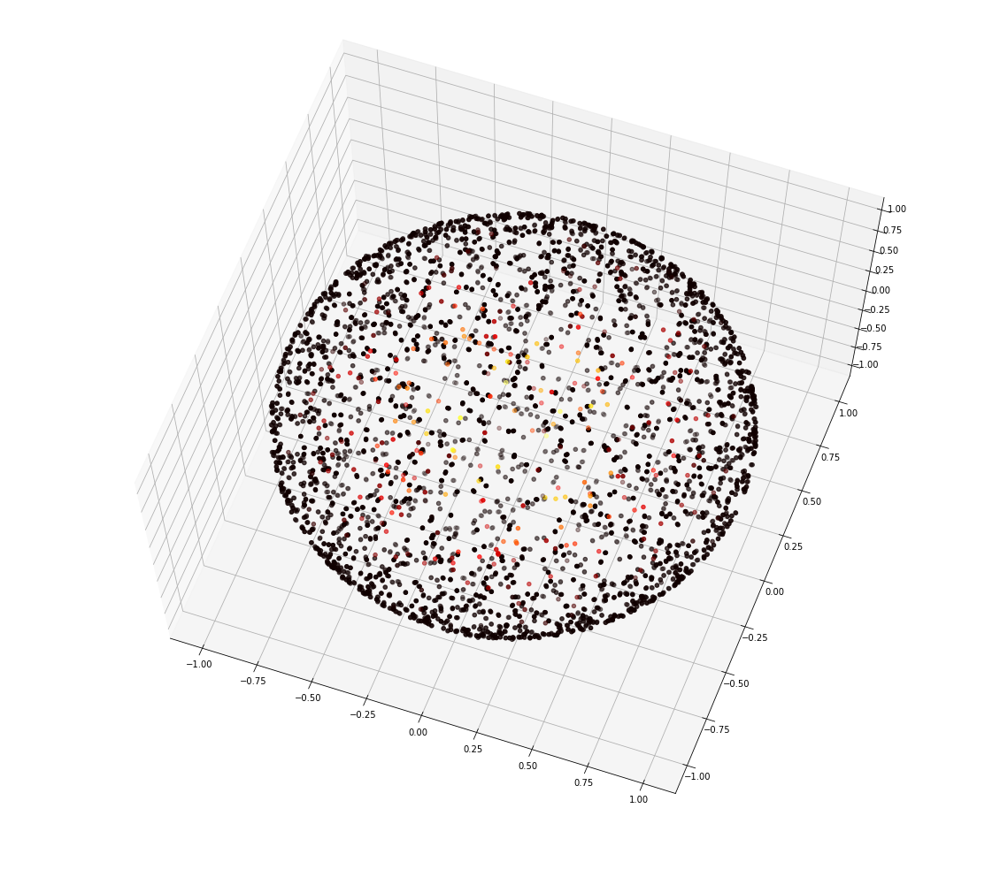

In [ ]:
fig = plt.figure(figsize=(20, 18))
ax = fig.add_subplot(111, projection="3d")
ax.view_init(elev=70, azim=-70)
ax.scatter(points[:, 0], points[:, 1], zs=-points[:, 2], c=sdf, cmap="hot_r")

In [ ]:
points, sdf = sample_sdf_near_surface(litten_trimesh, number_of_points=5000)

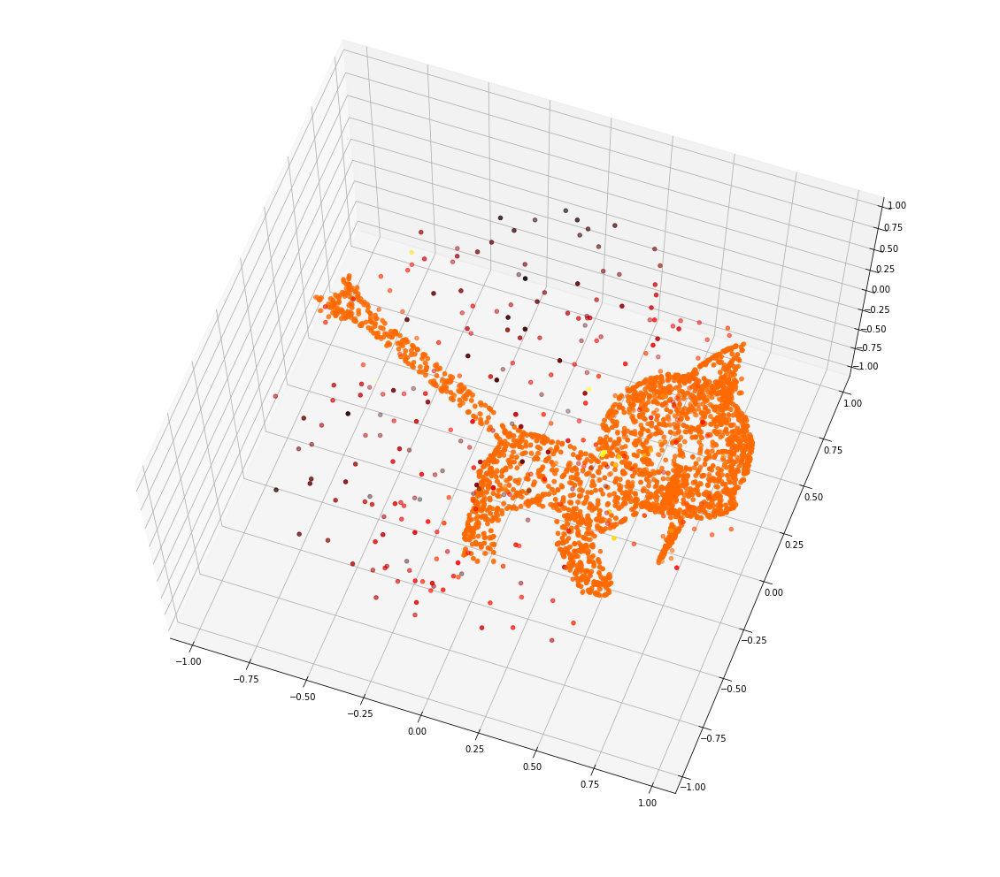

In [ ]:
fig = plt.figure(figsize=(20, 18))
ax = fig.add_subplot(111, projection="3d")
ax.view_init(elev=70, azim=-70)
ax.scatter(points[:, 0], points[:, 1], zs=-points[:, 2], c=sdf, cmap="hot_r")

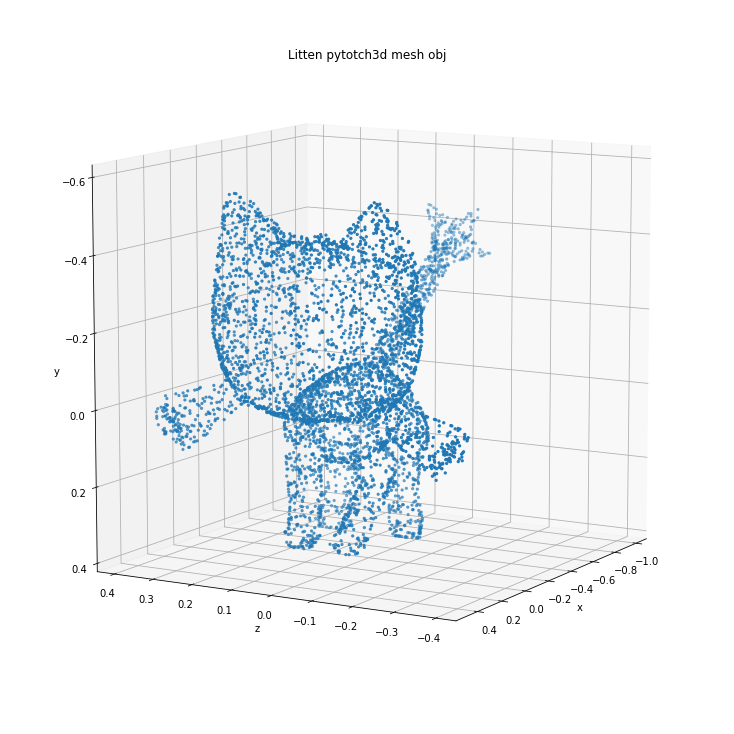

In [ ]:
points = sample_points_from_meshes(litten_mesh, 5000)
points = points.clone().detach().cpu().squeeze().unbind(1)
plot_pointcloud(points, elev=190, azim=150, title='Litten pytotch3d mesh obj')

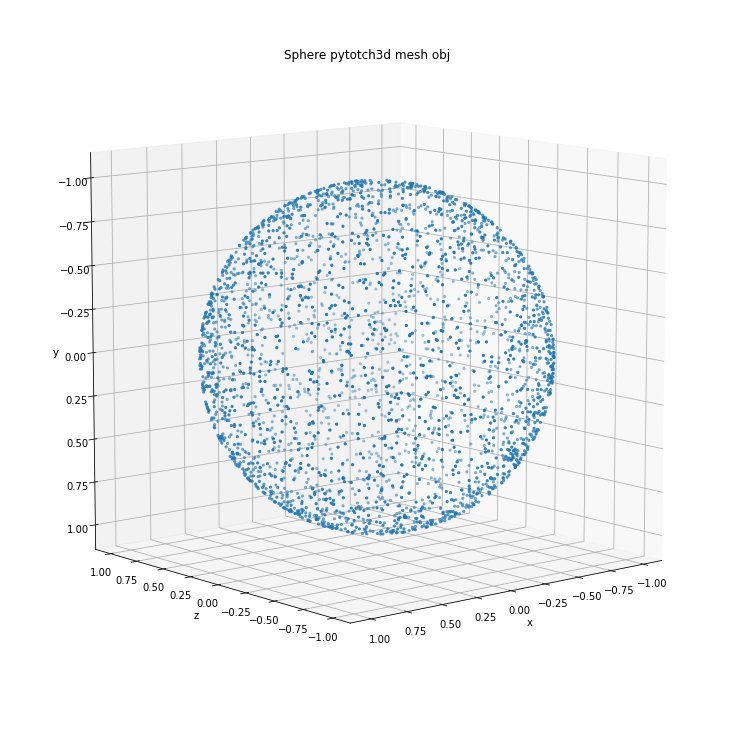

In [ ]:
points = sample_points_from_meshes(sphere_mesh, 3000)
points = points.clone().detach().cpu().squeeze().unbind(1)
plot_pointcloud(points, elev=190, azim=130, title='Sphere pytotch3d mesh obj')

# HW2-3

In [ ]:
!pip install torch torchvision
!pip install trimesh
!pip install git+https://github.com/facebookresearch/pytorch3d.git@v0.2.0
!pip install celluloid
!pip install tqdm

  Cloning https://github.com/facebookresearch/pytorch3d.git (to revision v0.2.0) to /tmp/pip-req-build-87mha51h
  Running command git clone -q https://github.com/facebookresearch/pytorch3d.git /tmp/pip-req-build-87mha51h
  Running command git checkout -q 686c8666d31d932ed42d3cd7319f249fc75e89a9
  Created wheel for pytorch3d: filename=pytorch3d-0.2.0-cp36-cp36m-linux_x86_64.whl size=10192472 sha256=507b9c53cdc1f986f9e2f9d802d02e821a4a53b3fa64223fe599e07958a2ebc1
  Stored in directory: /tmp/pip-ephem-wheel-cache-lb2x99c4/wheels/be/f5/98/553383839048dd7452b1d5062c35ad0102e2a72b5b2723623a
Successfully built pytorch3d


In [ ]:
import os
import pathlib
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline

# You should work in Jupyter.
from tqdm import tqdm_notebook

from celluloid import Camera

import torch

# untilitis 
from pytorch3d.utils import ico_sphere

# loss functions and regulaziers
from pytorch3d.loss import (
    chamfer_distance,
    mesh_edge_loss,
    mesh_laplacian_smoothing,
    mesh_normal_consistency
)

# io utils
from pytorch3d.io import load_obj

# operations with data
from pytorch3d.ops import sample_points_from_meshes

# datastructures
from pytorch3d.structures import Meshes, Textures

# render 
from pytorch3d.renderer import (
    look_at_view_transform,
    OpenGLPerspectiveCameras,
    DirectionalLights, 
    RasterizationSettings, 
    MeshRenderer, 
    MeshRasterizer,  
    HardPhongShader
)

import trimesh
from trimesh import registration
from trimesh import visual

In [ ]:
# If you have got a CUDA device, you can use GPU mode
if torch.cuda.is_available():
  device = torch.device('cuda:0')
  torch.cuda.set_device(device)
else:
  device = torch.device('cpu')

In [ ]:
!mkdir data

In [ ]:
path_to_model = os.path.join("data","Litten.obj")
path_to_orig = pathlib.Path("data", "mesh_source.obj")
path_to_rot = pathlib.Path("data", "mesh_target.obj")

In [ ]:
# Bunny mesh in pytorch3d
verts, faces_idx, _ = load_obj(path_to_model)
faces = faces_idx.verts_idx

center = verts.mean(0)
verts = verts - center
scale = max(verts.abs().max(0)[0])
verts = verts / scale

# Initialize each vertex to be white in color.
verts_rgb = torch.ones_like(verts)[None]  # (1, V, 3)

textures = Textures(verts_rgb=verts_rgb.to(device))

# Create a Meshes object for the bunny.
litten_mesh = Meshes(
    verts=[verts.to(device)],   
    faces=[faces.to(device)], 
    textures=textures
)

# Sphere mesh in pytorch3d
sphere_mesh = ico_sphere(4, device)
verts_rgb = torch.ones_like(sphere_mesh.verts_list()[0])[None]
sphere_mesh.textures = Textures(verts_rgb=verts_rgb.to(device))

/usr/local/lib/python3.6/dist-packages/pytorch3d/io/obj_io.py:484: UserWarning: Mtl file does not exist: data/Litten.mtl
  warnings.warn(f"Mtl file does not exist: {f_mtl}")


In [ ]:
# Mesh to pointcloud with normals in pytorch3d
num_points_to_sample = 25000

litten_vert, litten_norm = sample_points_from_meshes(
    litten_mesh,
    num_points_to_sample ,
    return_normals=True
)

sphere_vert, sphere_norm = sample_points_from_meshes(
    sphere_mesh,
    num_points_to_sample,
    return_normals=True
)

In [ ]:
def convert_to_mesh(mesh):
    """Trimesh может загружать сцены вместо монолитного объекта
    """
    if isinstance(mesh, trimesh.Scene):
        return mesh.dump(concatenate=True)
    else:
        return mesh
    
def scale_to_unit(mesh: trimesh.Trimesh):
    length, weight, height = mesh.extents
    scale = 1 / max(length, weight, height)
    mesh.apply_scale((scale, scale, scale))

In [ ]:
mesh_target = convert_to_mesh(trimesh.load_mesh(str(path_to_orig)))
mesh_source = convert_to_mesh(trimesh.load_mesh(str(path_to_rot)))
mesh_target.rezero()
mesh_source.rezero()
scale_to_unit(mesh_target)
scale_to_unit(mesh_source)

In [ ]:
mesh_source.visual = visual.ColorVisuals(mesh_source, vertex_colors=(255, 0, 0, 255))
mesh_target.visual = visual.ColorVisuals(mesh_target, vertex_colors=(0, 255, 0, 255))

In [ ]:
scene = trimesh.Scene([mesh_source, mesh_target])

In [ ]:
# Initialize an OpenGL perspective camera.
cameras = OpenGLPerspectiveCameras(device=device)

# We will also create a phong renderer. This is simpler and only needs to render one face per pixel.
raster_settings = RasterizationSettings(
    image_size=1024, 
    blur_radius=0, 
    faces_per_pixel=1, 
)

# We can add a directional light in the scene. 
ambient_color = torch.FloatTensor([[0.0, 0.0, 0.0]]).to(device)
diffuse_color = torch.FloatTensor([[1.0, 1.0, 1.0]]).to(device)
specular_color = torch.FloatTensor([[0.1, 0.1, 0.1]]).to(device)
direction = torch.FloatTensor([[1, 1, 1]]).to(device)
lights = DirectionalLights(ambient_color=ambient_color,
                           diffuse_color=diffuse_color,
                           specular_color=specular_color,
                           direction=direction,
                           device=device)

phong_renderer = MeshRenderer(
    rasterizer=MeshRasterizer(
        cameras=cameras, 
        raster_settings=raster_settings
    ),
    shader=HardPhongShader(
        device=device, 
        cameras=cameras, 
        lights=lights
        )
)

# Select the viewpoint using spherical angles  
distance = 2.0   # distance from camera to the object`
elevation = 40.0   # angle of elevation in degrees
azimuth = 0.0  # No rotation so the camera is positioned on the +Z axis. 

# Get the position of the camera based on the spherical angles
R, T = look_at_view_transform(distance, elevation, azimuth, device=device,at=((-0.02,0.1,0.0),))

In [ ]:
# Render the bunny providing the values of R and T. 
image_litten = phong_renderer(meshes_world=litten_mesh, R=R, T=T)
image_sphere = phong_renderer(meshes_world=sphere_mesh, R=R, T=T)

image_sphere = image_sphere.cpu().numpy()
image_litten = image_litten.cpu().numpy()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


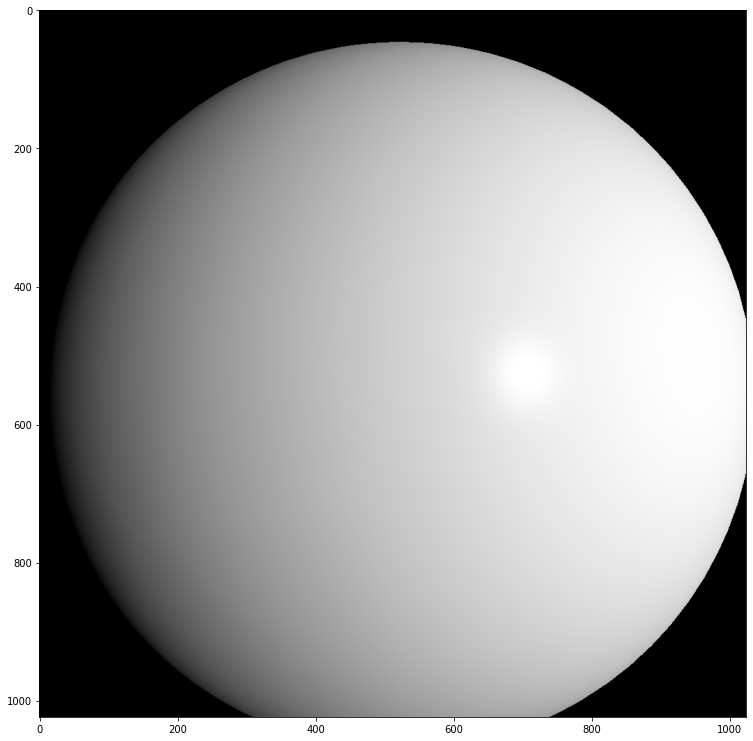

In [ ]:
# Source mesh of sphere
plt.figure(figsize=(13, 13))
plt.imshow(image_sphere.squeeze())
plt.grid(False)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


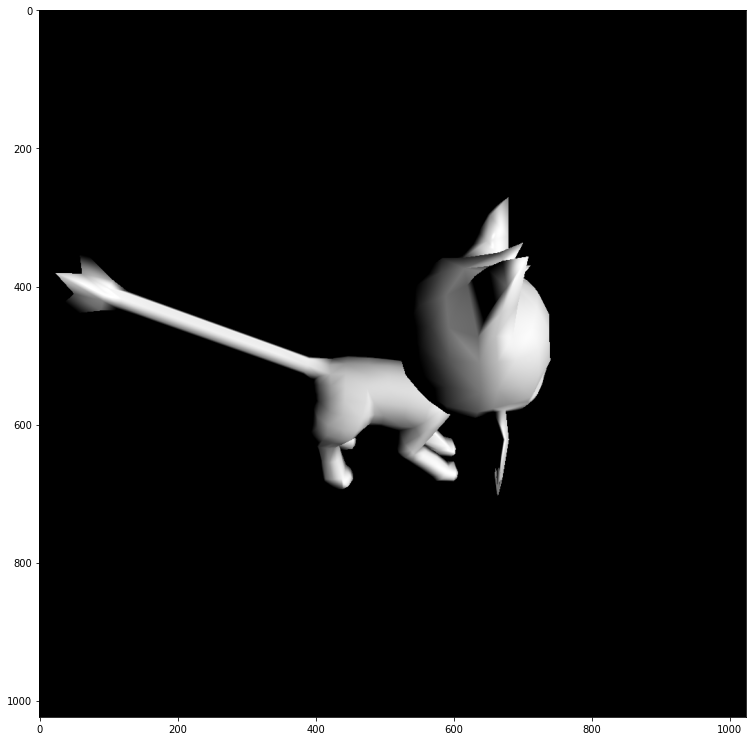

In [ ]:
# Target mesh of bunny
plt.figure(figsize=(13, 13))
plt.imshow(image_litten.squeeze())
plt.grid(False)

In [ ]:
scene.show()

In [ ]:
!pip install rtree

     |████████████████████████████████| 1.0MB 22.7MB/s 


In [ ]:
transform, cost = registration.mesh_other(mesh_source, mesh_target, samples=2_000, scale=True)

print("Величина ошибки регистрации: ", cost)
print("Матрица преобразования модели:")
print(transform)

Величина ошибки регистрации:  1.3054289707495215e-09
Матрица преобразования модели:
[[ 4.73993930e-01  7.19887415e-01 -1.96315038e-01  7.72522289e-02]
 [-3.31205093e-01  4.11387953e-01  7.08880011e-01  5.68556411e-04]
 [ 6.68640914e-01 -3.06544927e-01  4.90303240e-01 -9.21717873e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [ ]:
new_scene = scene.copy()
new_scene.geometry["geometry_0"].apply_transform(transform)

<trimesh.Trimesh(vertices.shape=(998, 3), faces.shape=(1476, 3))>

In [ ]:
new_scene.show()

In [ ]:
points_source, _ = trimesh.sample.sample_surface(mesh_source, 5000)
points_target, _ = trimesh.sample.sample_surface(mesh_target, 5000)

In [ ]:
matrix, transform, cost = registration.procrustes(points_source, points_target, reflection=True, translation=True, scale=True, return_cost=True)

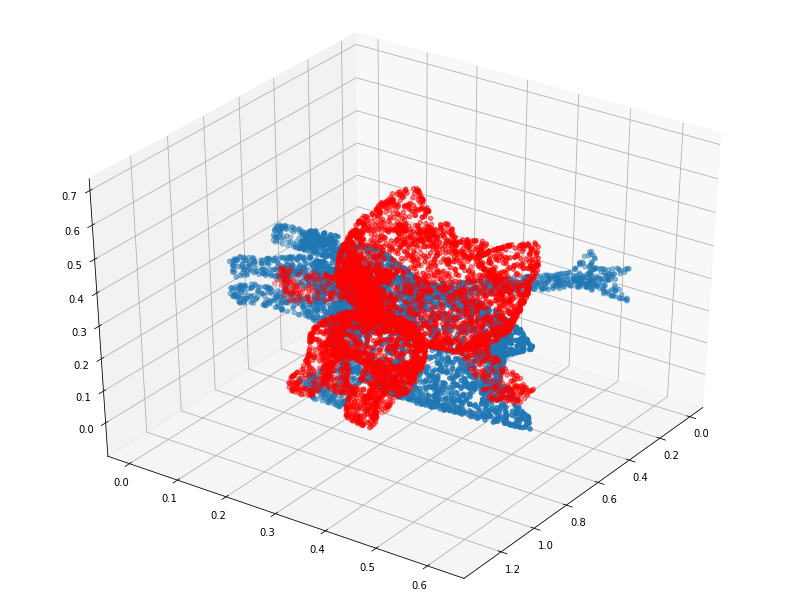

In [ ]:
fig = plt.figure(figsize=(14, 11))
ax = fig.add_subplot(111, projection="3d")
ax.view_init(elev=35, azim=35)
ax.scatter(points_target[:, 0], points_target[:, 1], zs=points_target[:, 2])
ax.scatter(transform[:, 0], transform[:, 1], zs=transform[:, 2], c="red")

In [ ]:
new_scene = scene.copy()
new_scene.geometry["geometry_0"].apply_transform(matrix)

<trimesh.Trimesh(vertices.shape=(998, 3), faces.shape=(1476, 3))>

In [ ]:
new_scene.show()

In [ ]:
# Chamfer loss and normal loss
loss_chamfer, loss_normals_chamfer = chamfer_distance(
    litten_vert, 
    sphere_vert, 
    x_normals=litten_norm,
    y_normals=sphere_norm
)

In [ ]:
print("Chamfer loss =", loss_chamfer.item())
print("Normal loss =", loss_normals_chamfer.item())

Chamfer loss = 0.7675174474716187
Normal loss = 0.8432192802429199


In [ ]:
print("Edge loss for litten.obj:", mesh_edge_loss(litten_mesh).item())
print("Edge loss for sphere.obj:", mesh_edge_loss(sphere_mesh).item())

Edge loss for litten.obj: 0.004362709820270538
Edge loss for sphere.obj: 0.005724199116230011


In [ ]:
print("Laplacian smoothing objective for litten.obj:", mesh_laplacian_smoothing(litten_mesh).item())
print("Laplacian smoothing objective for sphere.obj:", mesh_laplacian_smoothing(sphere_mesh).item())

Laplacian smoothing objective for litten.obj: 0.01931322179734707
Laplacian smoothing objective for sphere.obj: 0.0040009506046772


In [ ]:
print("Smooth regularizer for litten.obj:", mesh_normal_consistency(litten_mesh).item())
print("Smooth regularizer for sphere.obj:", mesh_normal_consistency(sphere_mesh).item())

Smooth regularizer for litten.obj: 0.18759942054748535
Smooth regularizer for sphere.obj: 0.0009780693799257278


In [ ]:
deform_verts = torch.full(sphere_mesh.verts_packed().shape, 0.0, device=device, requires_grad=True)
optimizer = torch.optim.SGD([deform_verts], lr=1.0, momentum=0.9)

In [ ]:
# Number of optimization steps
Niter = 1001
# Weight for the chamfer loss
w_chamfer = 1.0 
# Weight for mesh edge loss
w_edge = 1.0 
# Weight for mesh normal consistency
w_normal = 0.01 
# Weight for mesh laplacian smoothing
w_laplacian = 0.1 
# Plot period for the losses
plot_period = 50

chamfer_losses = []
laplacian_losses = []
edge_losses = []
normal_losses = []

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  """Entry point for launching an IPython kernel.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

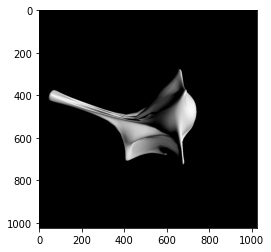

In [ ]:
loop = tqdm_notebook(range(Niter))

%matplotlib inline
fig = plt.figure()
camera = Camera(fig)


for i in loop:
    # Initialize optimizer
    optimizer.zero_grad()
    
    # Deform the mesh
    new_src_mesh = sphere_mesh.offset_verts(deform_verts)
    
    # We sample 5k points from the surface of each mesh 
    sample_trg = sample_points_from_meshes(litten_mesh, 5000)
    sample_src = sample_points_from_meshes(new_src_mesh, 5000)
    
    # We compare the two sets of pointclouds by computing (a) the chamfer loss
    loss_chamfer, _ = chamfer_distance(sample_trg, sample_src)
    
    # and (b) the edge length of the predicted mesh
    loss_edge = mesh_edge_loss(new_src_mesh)
    
    # mesh normal consistency
    loss_normal = mesh_normal_consistency(new_src_mesh)
    
    # mesh laplacian smoothing
    loss_laplacian = mesh_laplacian_smoothing(new_src_mesh, method="uniform")
    
    # Weighted sum of the losses
    loss = loss_chamfer * w_chamfer + loss_edge * w_edge + loss_normal * w_normal + loss_laplacian * w_laplacian
    
    # Print the losses
    loop.set_description('total_loss = %.6f' % loss)
    
    # Save the losses for plotting
    chamfer_losses.append(loss_chamfer)
    edge_losses.append(loss_edge)
    normal_losses.append(loss_normal)
    laplacian_losses.append(loss_laplacian)
    

    # Plot mesh
    if i % plot_period == 0 or i==0:

        # Render the litten providing the values of R and T. 
        image_litten = phong_renderer(meshes_world=new_src_mesh, R=R, T=T)
        image_litten = image_litten.detach().cpu().numpy()

        plt.imshow(image_litten.squeeze())
        plt.grid(False)
        camera.snap()

        
    # Optimization step
    loss.backward()
    optimizer.step()

In [ ]:
animation = camera.animate()
animation.save('deformation_animation.mp4')

Text(0.5, 1.0, 'Loss vs iterations')

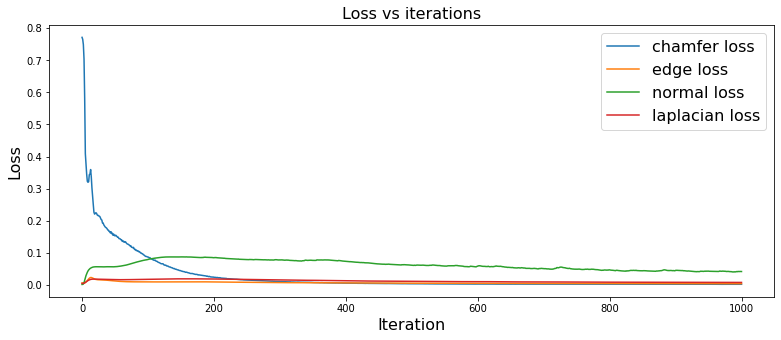

In [ ]:
# Losses evaluation
fig = plt.figure(figsize=(13, 5))
ax = fig.gca()
ax.plot(chamfer_losses, label="chamfer loss")
ax.plot(edge_losses, label="edge loss")
ax.plot(normal_losses, label="normal loss")
ax.plot(laplacian_losses, label="laplacian loss")
ax.legend(fontsize="16")
ax.set_xlabel("Iteration", fontsize="16")
ax.set_ylabel("Loss", fontsize="16")
ax.set_title("Loss vs iterations", fontsize="16")

# HW 5

In [ ]:
import os, sys
from google.colab import drive
drive.mount('/content/mnt')
nb_path = '/content/notebooks'
os.symlink('/content/mnt/My Drive/Colab Notebooks', nb_path)
sys.path.append(nb_path)

Mounted at /content/mnt


In [1]:
import IPython
IPython.display.HTML('<h2>1-Minute Presentation</h2><iframe width="720" height="405" src="https://www.youtube.com/embed/-1XYTmm8HhE" frameborder="0" allow="accelerometer; autoplay; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe><br><h2>5-Minute Presentation</h2><iframe width="720" height="405" src="https://www.youtube.com/embed/uEDqCxvF5yc" frameborder="0" allow="accelerometer; autoplay; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>')

In [2]:
!git clone https://github.com/facebookresearch/pifuhd

Cloning into 'pifuhd'...
remote: Enumerating objects: 22, done.
remote: Counting objects: 100% (22/22), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 213 (delta 7), reused 4 (delta 1), pack-reused 191
Receiving objects: 100% (213/213), 407.53 KiB | 669.00 KiB/s, done.
Resolving deltas: 100% (100/100), done.


In [1]:
cd /content/pifuhd/sample_images

/content/pifuhd/sample_images


In [2]:
from google.colab import files

filename = list(files.upload().keys())[0]

Saving foto2.jpg to foto2 (1).jpg


In [3]:
import os

try:
  image_path = '/content/pifuhd/sample_images/%s' % filename
except:
  image_path = '/content/pifuhd/sample_images/test.png' # example image
image_dir = os.path.dirname(image_path)
file_name = os.path.splitext(os.path.basename(image_path))[0]

# output pathes
obj_path = '/content/pifuhd/results/pifuhd_final/recon/result_%s_256.obj' % file_name
out_img_path = '/content/pifuhd/results/pifuhd_final/recon/result_%s_256.png' % file_name
video_path = '/content/pifuhd/results/pifuhd_final/recon/result_%s_256.mp4' % file_name
video_display_path = '/content/pifuhd/results/pifuhd_final/result_%s_256_display.mp4' % file_name

In [6]:
cd /content

/content


In [7]:
!git clone https://github.com/Daniil-Osokin/lightweight-human-pose-estimation.pytorch.git

Cloning into 'lightweight-human-pose-estimation.pytorch'...
remote: Enumerating objects: 11, done.
remote: Counting objects: 100% (11/11), done.
remote: Compressing objects: 100% (8/8), done.
remote: Total 115 (delta 3), reused 8 (delta 3), pack-reused 104
Receiving objects: 100% (115/115), 227.97 KiB | 435.00 KiB/s, done.
Resolving deltas: 100% (46/46), done.


In [5]:
cd /content/lightweight-human-pose-estimation.pytorch/

/content/lightweight-human-pose-estimation.pytorch


In [9]:
!wget https://download.01.org/opencv/openvino_training_extensions/models/human_pose_estimation/checkpoint_iter_370000.pth

--2021-01-19 05:12:27--  https://download.01.org/opencv/openvino_training_extensions/models/human_pose_estimation/checkpoint_iter_370000.pth
Resolving download.01.org (download.01.org)... 104.124.231.88, 2600:1417:76:483::4b21, 2600:1417:76:480::4b21
Connecting to download.01.org (download.01.org)|104.124.231.88|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87959810 (84M) [application/octet-stream]
Saving to: ‘checkpoint_iter_370000.pth’

checkpoint_iter_370 100%[===================>]  83.88M   311MB/s    in 0.3s    

2021-01-19 05:12:28 (311 MB/s) - ‘checkpoint_iter_370000.pth’ saved [87959810/87959810]



In [6]:
import torch
import cv2
import numpy as np
from models.with_mobilenet import PoseEstimationWithMobileNet
from modules.keypoints import extract_keypoints, group_keypoints
from modules.load_state import load_state
from modules.pose import Pose, track_poses
import demo

def get_rect(net, images, height_size):
    net = net.eval()

    stride = 8
    upsample_ratio = 4
    num_keypoints = Pose.num_kpts
    previous_poses = []
    delay = 33
    for image in images:
        rect_path = image.replace('.%s' % (image.split('.')[-1]), '_rect.txt')
        img = cv2.imread(image, cv2.IMREAD_COLOR)
        orig_img = img.copy()
        orig_img = img.copy()
        heatmaps, pafs, scale, pad = demo.infer_fast(net, img, height_size, stride, upsample_ratio, cpu=False)

        total_keypoints_num = 0
        all_keypoints_by_type = []
        for kpt_idx in range(num_keypoints):  # 19th for bg
            total_keypoints_num += extract_keypoints(heatmaps[:, :, kpt_idx], all_keypoints_by_type, total_keypoints_num)

        pose_entries, all_keypoints = group_keypoints(all_keypoints_by_type, pafs)
        for kpt_id in range(all_keypoints.shape[0]):
            all_keypoints[kpt_id, 0] = (all_keypoints[kpt_id, 0] * stride / upsample_ratio - pad[1]) / scale
            all_keypoints[kpt_id, 1] = (all_keypoints[kpt_id, 1] * stride / upsample_ratio - pad[0]) / scale
        current_poses = []

        rects = []
        for n in range(len(pose_entries)):
            if len(pose_entries[n]) == 0:
                continue
            pose_keypoints = np.ones((num_keypoints, 2), dtype=np.int32) * -1
            valid_keypoints = []
            for kpt_id in range(num_keypoints):
                if pose_entries[n][kpt_id] != -1.0:  # keypoint was found
                    pose_keypoints[kpt_id, 0] = int(all_keypoints[int(pose_entries[n][kpt_id]), 0])
                    pose_keypoints[kpt_id, 1] = int(all_keypoints[int(pose_entries[n][kpt_id]), 1])
                    valid_keypoints.append([pose_keypoints[kpt_id, 0], pose_keypoints[kpt_id, 1]])
            valid_keypoints = np.array(valid_keypoints)
            
            if pose_entries[n][10] != -1.0 or pose_entries[n][13] != -1.0:
              pmin = valid_keypoints.min(0)
              pmax = valid_keypoints.max(0)

              center = (0.5 * (pmax[:2] + pmin[:2])).astype(np.int)
              radius = int(0.65 * max(pmax[0]-pmin[0], pmax[1]-pmin[1]))
            elif pose_entries[n][10] == -1.0 and pose_entries[n][13] == -1.0 and pose_entries[n][8] != -1.0 and pose_entries[n][11] != -1.0:
              # if leg is missing, use pelvis to get cropping
              center = (0.5 * (pose_keypoints[8] + pose_keypoints[11])).astype(np.int)
              radius = int(1.45*np.sqrt(((center[None,:] - valid_keypoints)**2).sum(1)).max(0))
              center[1] += int(0.05*radius)
            else:
              center = np.array([img.shape[1]//2,img.shape[0]//2])
              radius = max(img.shape[1]//2,img.shape[0]//2)

            x1 = center[0] - radius
            y1 = center[1] - radius

            rects.append([x1, y1, 2*radius, 2*radius])

        np.savetxt(rect_path, np.array(rects), fmt='%d')

In [11]:
net = PoseEstimationWithMobileNet()
checkpoint = torch.load('checkpoint_iter_370000.pth', map_location='cpu')
load_state(net, checkpoint)

get_rect(net.cuda(), [image_path], 512)

In [7]:
cd /content/pifuhd/

/content/pifuhd


In [13]:
!sh ./scripts/download_trained_model.sh

+ mkdir -p checkpoints
+ cd checkpoints
+ wget https://dl.fbaipublicfiles.com/pifuhd/checkpoints/pifuhd.pt pifuhd.pt
--2021-01-19 05:13:50--  https://dl.fbaipublicfiles.com/pifuhd/checkpoints/pifuhd.pt
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 104.22.75.142, 172.67.9.4, 104.22.74.142, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|104.22.75.142|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1548375177 (1.4G) [application/octet-stream]
Saving to: ‘pifuhd.pt’

pifuhd.pt           100%[===================>]   1.44G  13.9MB/s    in 1m 48s  

2021-01-19 05:15:39 (13.7 MB/s) - ‘pifuhd.pt’ saved [1548375177/1548375177]

--2021-01-19 05:15:39--  http://pifuhd.pt/
Resolving pifuhd.pt (pifuhd.pt)... failed: Name or service not known.
wget: unable to resolve host address ‘pifuhd.pt’
FINISHED --2021-01-19 05:15:39--
Total wall clock time: 1m 49s
Downloaded: 1 files, 1.4G in 1m 48s (13.7 MB/s)


In [8]:
# Warning: all images with the corresponding rectangle files under -i will be processed. 
!python -m apps.simple_test -r 256 --use_rect -i $image_dir

# seems that 256 is the maximum resolution that can fit into Google Colab. 
# If you want to reconstruct a higher-resolution mesh, please try with your own machine. 

Resuming from  ./checkpoints/pifuhd.pt
test data size:  1
initialize network with normal
initialize network with normal
generate mesh (test) ...
  0% 0/1 [00:00<?, ?it/s]./results/pifuhd_final/recon/result_foto2_256.obj
100% 1/1 [00:06<00:00,  6.35s/it]


In [15]:
# !pip install pytorch3d

# If you get an error in the next cell, you can instead try the following command (don't forget to comment out the one above!).
# Note that this error is caused by inconsistent cuda version for the pytorch3d package and pytorch in Colab environment.
# Thus, this issue may persist unless pytorch3d in the pip package is updated with the cuda version consistent with pytorch in Colab.
# Also please be aware that the following command is much slower as it builds pytorch3d from scratch.

# !pip install 'git+https://github.com/facebookresearch/pytorch3d.git@stable'

# You can try another solution below as well. This is also slow and requires you to restart the runtime.

!pip install 'torch==1.6.0+cu101' -f https://download.pytorch.org/whl/torch_stable.html
!pip install 'torchvision==0.7.0+cu101' -f https://download.pytorch.org/whl/torch_stable.html
!pip install 'pytorch3d==0.2.5'

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 708.0MB 22kB/s 
ERROR: torchvision 0.8.1+cu101 has requirement torch==1.7.0, but you'll have torch 1.6.0+cu101 which is incompatible.
  Found existing installation: torch 1.7.0+cu101
    Uninstalling torch-1.7.0+cu101:
      Successfully uninstalled torch-1.7.0+cu101


Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 5.9MB 51.9MB/s 
  Found existing installation: torchvision 0.8.1+cu101
    Uninstalling torchvision-0.8.1+cu101:
      Successfully uninstalled torchvision-0.8.1+cu101
     |████████████████████████████████| 20.6MB 346kB/s 
     |████████████████████████████████| 276kB 41.9MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.2.post20210115-cp36-none-any.whl size=40892 sha256=fc7c751edd44e1a863d274135099860c1bcc34dfad56320e6954be6ba9992f01
  Stored in directory: /root/.cache/pip/wheels/cc/0f/bc/fb742771f4a877f1211dd6ed36283b0db9c0ceb2b409b4a039
  Created wheel for pyyaml: filename=PyYAML-5.3.1-cp36-cp36m-linux_x86_64.whl size=44621 sha256=1d87687614f11ef4fd24fc4c9c0f770d67dfc6b152240561b91b136902b05c18
  Stored in directory: /root/.cache/pip/wheels/a7/c1/ea/cf5bd31012e735dc1dfea3131a2d5eae7978b251083d6247bd
  Created wheel for iopath: filename=iopath-0.1.2-cp36-none-any.whl size

In [9]:
from lib.colab_util import generate_video_from_obj, set_renderer, video

renderer = set_renderer()
generate_video_from_obj(obj_path, out_img_path, video_path, renderer)

# we cannot play a mp4 video generated by cv2
!ffmpeg -i $video_path -vcodec libx264 $video_display_path -y -loglevel quiet
video(video_display_path)

** fvcore version of PathManager will be deprecated soon. **
** Please migrate to the version in iopath repo. **
https://github.com/facebookresearch/iopath 



In [11]:
cd /content/

/content


# HW 4

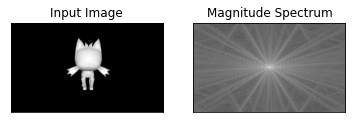

In [16]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('front01.png',0)
f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20*np.log(np.abs(fshift))

plt.subplot(121),plt.imshow(img, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

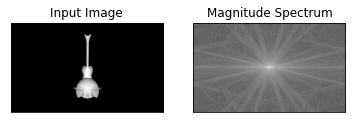

In [17]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('top02.png',0)
f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20*np.log(np.abs(fshift))

plt.subplot(121),plt.imshow(img, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

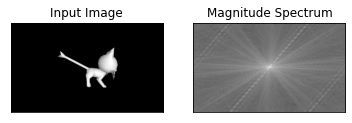

In [18]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('right03.png',0)
f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20*np.log(np.abs(fshift))

plt.subplot(121),plt.imshow(img, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

# HW from book

In [23]:
from PIL import Image
from numpy import *
from scipy.ndimage import filters

im = array(Image.open('foto3.jpg'))

Task1


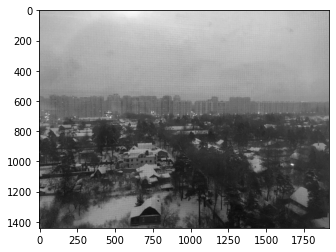

In [73]:
iml = array(Image.open('foto3.jpg').convert('L'))

imshow(iml)

show()

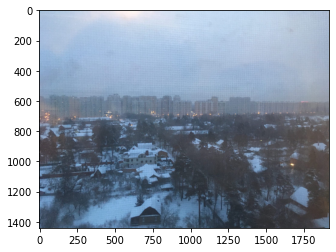

In [36]:
from pylab import *

imshow(im)

show()

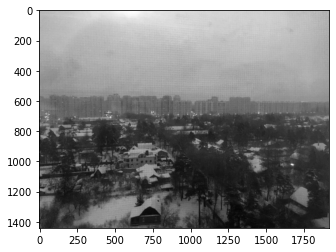

In [67]:
im2 = filters.gaussian_filter(iml, 1)

imshow(im2)

show()

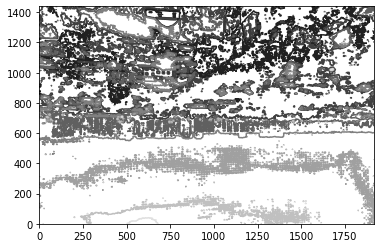

In [70]:
figure()

gray()

contour(im2)

show()

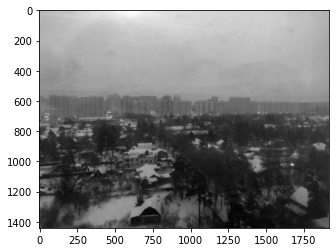

In [71]:
im2 = filters.gaussian_filter(iml, 2)

imshow(im2)

show()

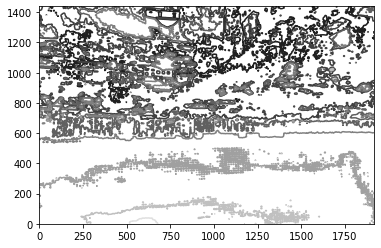

In [72]:
figure()

gray()

contour(im2)

show()

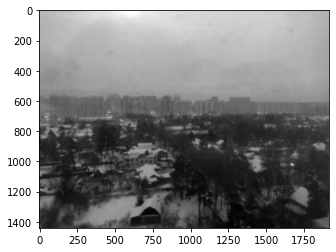

In [74]:
im2 = filters.gaussian_filter(iml, 3)

imshow(im2)

show()

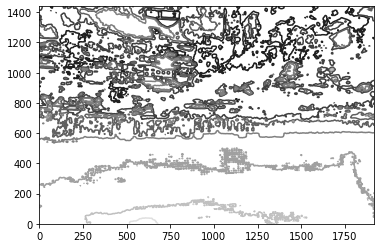

In [76]:
figure()

gray()

contour(im2)

show()

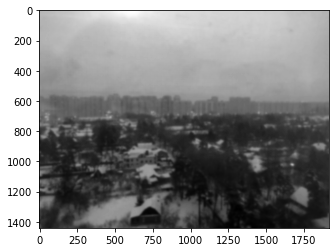

In [78]:
im2 = filters.gaussian_filter(iml, 5)

imshow(im2)

show()

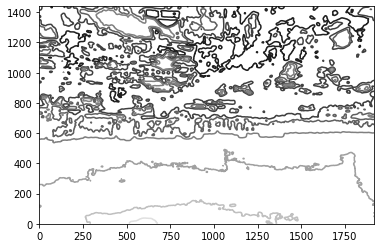

In [79]:
figure()

gray()

contour(im2)

show()

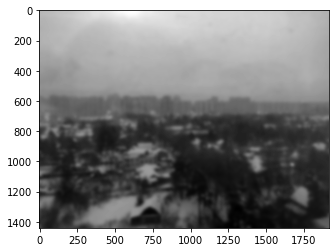

In [80]:
im2 = filters.gaussian_filter(iml, 9)

imshow(im2)

show()

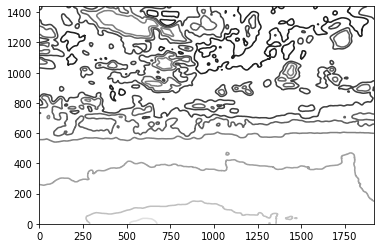

In [81]:
figure()

gray()

contour(im2)

show()

Task2

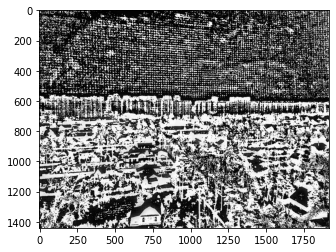

In [85]:
im2 = filters.gaussian_filter(iml, 20)

im3 = iml - im2

imshow(im3)

show()

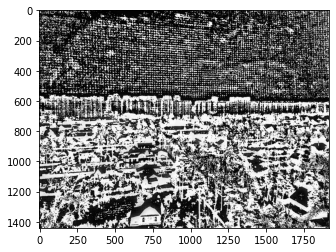

In [86]:
im2 = filters.gaussian_filter(iml, 20)

im3 = iml - im2

imshow(im3)

show()

Task3

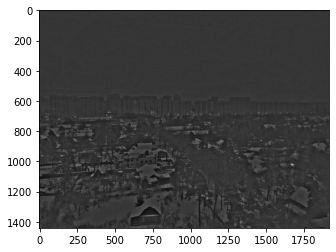

In [87]:
im2 = filters.gaussian_filter(iml, 20)

im3 = iml / im2

imshow(im3)

show()

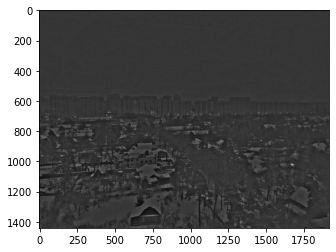

In [88]:
im2 = filters.gaussian_filter(iml, 20)

im3 = iml / im2

imshow(im3)

show()

Task6

In [89]:
imx = zeros(iml.shape)

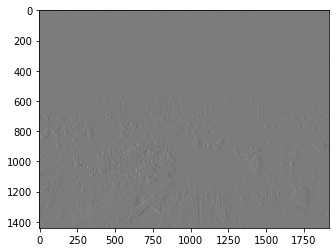

In [90]:
imx = zeros(iml.shape)

filters.sobel(iml, 1, imx)

imshow(imx)

show()

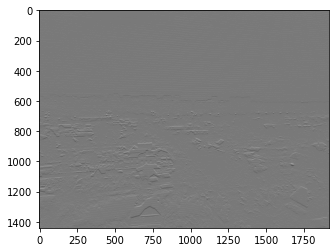

In [91]:
imy = zeros(iml.shape)

filters.sobel(iml, 0, imy)

imshow(imy)

show()

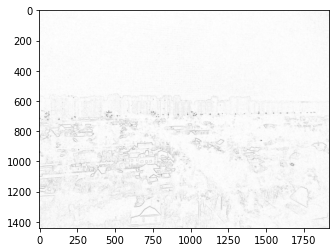

In [94]:
imxy = sqrt(imx ** 2 + imy ** 2)

imshow(-imxy)

show()

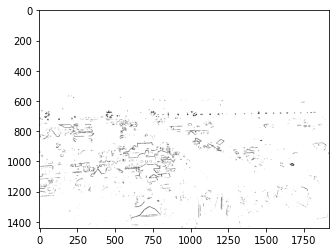

In [99]:
from scipy.ndimage import measurements, morphology

imbin = 1 * (imxy < 128)

imshow(imbin)

show()

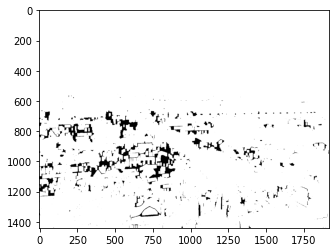

In [100]:
im_open = morphology.binary_opening(imbin, ones((9, 5)), iterations=2)

imshow(im_open)

show()

Task7

In [130]:
labels_open, objects_open = measurements.label(im_open)

, objects_open

(array([33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 34, 34, 34, 34, 34, 34,
        34, 34, 34, 34, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 34, 34,
        34, 34, 34, 34, 34, 34, 34, 34, 33, 33, 33, 33, 33, 33, 33, 33, 33,
        33, 33, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 33, 33, 33, 33, 33,
        33, 33, 33, 33, 33, 33, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 33,
        33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 34, 34, 34, 34, 34, 34, 34,
        34, 34, 34, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 34, 34, 34,
        34, 34, 34, 34, 34, 34, 34, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33,
        33, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 33, 33, 33, 33, 33, 33,
        33, 33, 33, 33, 33, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 33, 33,
        33, 33, 33, 33, 33, 33, 33, 33, 33, 34, 34, 34, 34, 34, 34, 34, 34,
        34, 34, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 34, 34, 34, 34,
        34, 34, 34, 34, 34, 34, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33, 33,
        34, 

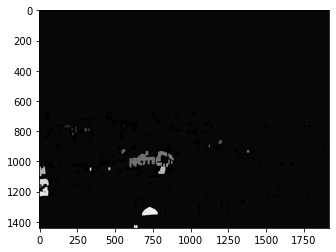

In [102]:
imshow(labels_open)

show()

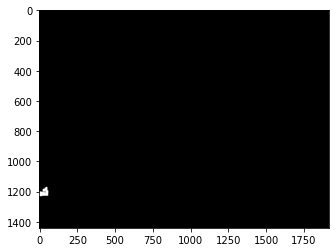

In [134]:
imshow(1 * (labels_open == 31))
show()

(array([ 270.,  180.,  153.,  700.,  452.,  190.,  224.,  391.,  170.,
         559.,  179.,  632.,  302., 8878., 2922.,  908.,  279.,  180.,
         241.,  349.,  276.,  179., 2091., 1552.,  262.,  229.,  180.,
        2350.,  162., 2547., 4010.,  399.]),
 array([ 2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13., 14.,
        15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25., 26., 27.,
        28., 29., 30., 31., 32., 33., 34.]),
 <a list of 32 Patch objects>)

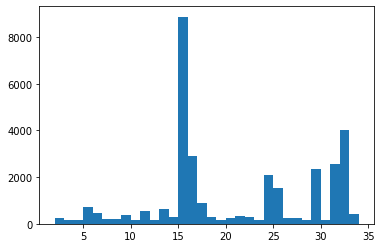

In [173]:
hist(labels_open[labels_open > 1].flatten(), 32)

In [137]:
measurements.center_of_mass(labels_open)

(786.9830264324802, 882.4390726787555)

In [145]:
centers = np.zeros(im.shape[:2], dtype=np.int64)

In [154]:
for i in range(2, 35):
    mas = 1 * (labels_open == i)
    center = measurements.center_of_mass(mas)
    centers[int(center[0]) - 5: int(center[0]) + 5, int(center[1]) - 5:int(center[1]) + 5] = 1

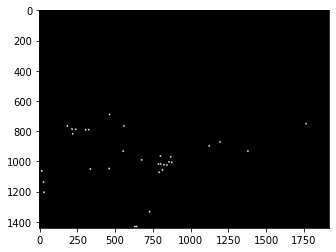

In [155]:
imshow(centers)

show()

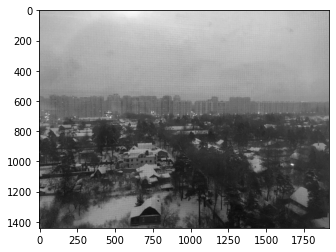

In [158]:
imshow(iml)

show()

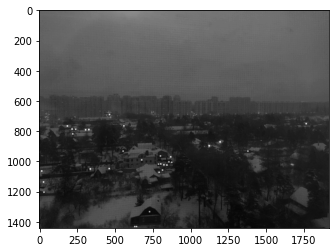

In [161]:
imshow(iml + 255 * centers)
show()

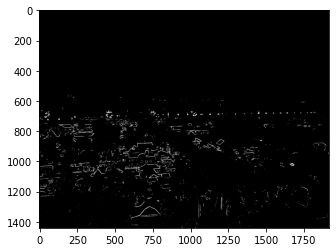

In [167]:
imshow(255 * (imxy > 128))

show()

task5

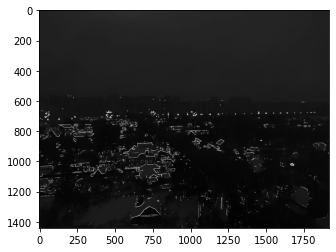

In [170]:
imshow(iml + 255 * (imxy > 128))

show()